**Import Libraries**

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

**Load the fingerprint**

In [4]:
def show_images_subplots(images, titles=None, cols=5, cmap='gray', figsize=(15, 10)):
    rows = (len(images) + cols - 1) // cols
    plt.figure(figsize=figsize)
    for i, img in enumerate(images):
        plt.subplot(rows, cols, i + 1)
        plt.imshow(img, cmap=cmap)
        if titles:
            plt.title(titles[i], fontsize=10)
        plt.axis('off')
    plt.tight_layout()
    plt.show()

In [7]:
dataset_path = r'E:\DeepLearning\ImageProcessing\project2\Dataset01\SOCOFing\Real'

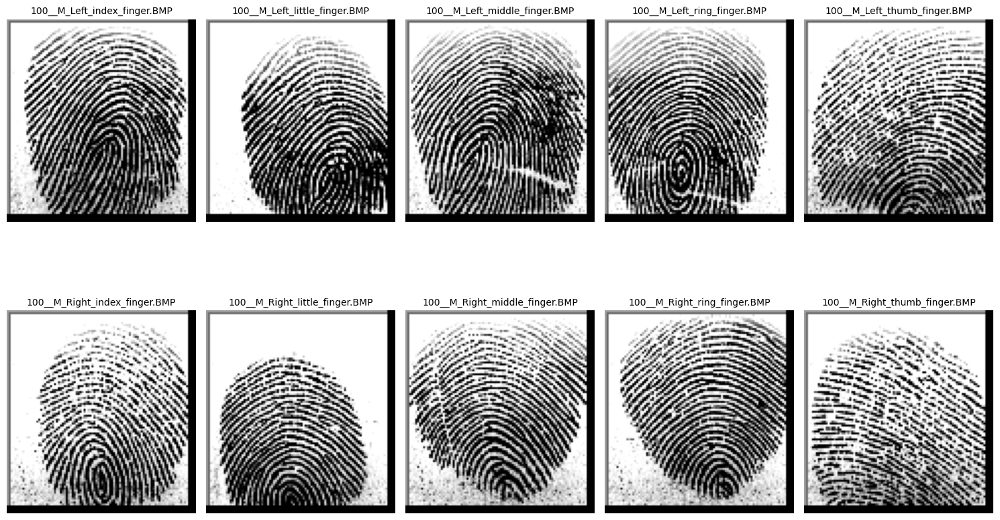

In [9]:
num_images = 10 
image_files = os.listdir(dataset_path)[:num_images]

images = []
image_titles = []

for img_file in image_files:
    img_path = os.path.join(dataset_path, img_file)
    # Convert image to Grayscale
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE) 
    images.append(img)
    image_titles.append(img_file)

# Show original images
show_images_subplots(images, titles=image_titles, cols=5)

***Load the first 5 fingerprint & last 5 footprint from 2 separate datasets***

In [3]:
fingerprint_dataset_path = r'E:\DeepLearning\ImageProcessing\project2\Dataset01\SOCOFing\Real' 
footprint_dataset_path = r'E:\DeepLearning\ImageProcessing\project2\Dataset02\Dactyloscopic\Left'

In [5]:
# Number of images
num_images = 10

# Load images
images = []
image_titles = []

# Process fingerprints (1 to 5)
fingerprint_files = os.listdir(fingerprint_dataset_path)[:5]
for img_file in fingerprint_files:
    img_path = os.path.join(fingerprint_dataset_path, img_file)
    # Convert image to Grayscale
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    images.append(img)
    image_titles.append(f'Fingerprint: {img_file}')

# Process footprints (6 to 10)
footprint_files = os.listdir(footprint_dataset_path)[:5]
for img_file in footprint_files:
    img_path = os.path.join(footprint_dataset_path, img_file)
    # Convert image to Grayscale
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    images.append(img)
    image_titles.append(f'Footprint: {img_file}')

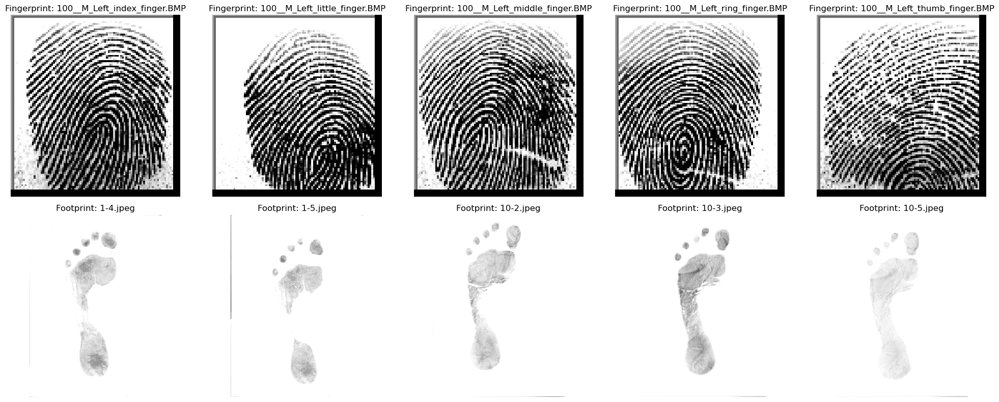

In [7]:
def show_images_subplots(images, titles, cols=5):
    rows = (len(images) + cols - 1) // cols
    plt.figure(figsize=(20, rows * 4))
    for i, img in enumerate(images):
        plt.subplot(rows, cols, i + 1)
        plt.imshow(img, cmap='gray')
        plt.title(titles[i])
        plt.axis('off')
    plt.tight_layout()
    plt.show()

# Call the function
show_images_subplots(images, titles=image_titles, cols=5)

**Apply Gaussian blur**

(*will work for single dataset*)

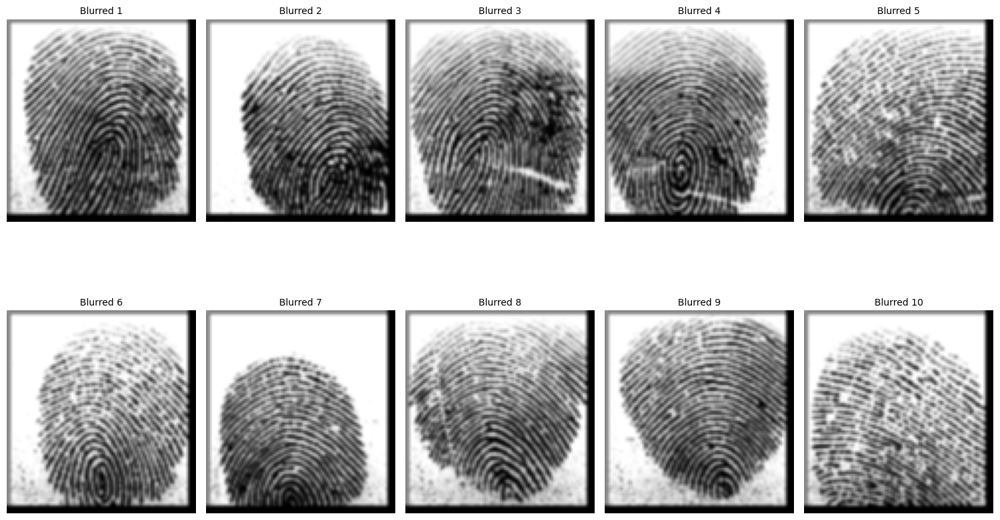

In [11]:
blurred_images = [cv2.GaussianBlur(img, (3, 3), 0) for img in images]
show_images_subplots(blurred_images, titles=[f"Blurred {i+1}" for i in range(len(blurred_images))])

**work for both datasets at a time**

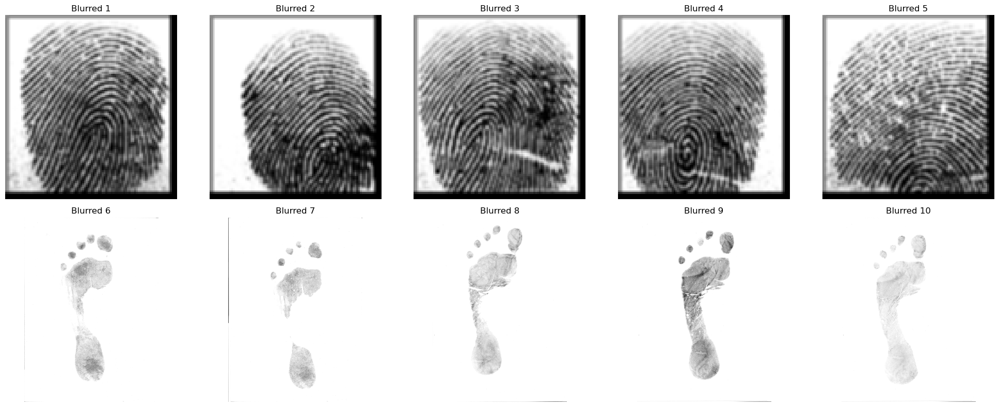

In [9]:
blurred_images = [cv2.GaussianBlur(img, (3, 3), 0) for img in images]
show_images_subplots(blurred_images, titles=[f"Blurred {i+1}" for i in range(len(blurred_images))])

**Apply Thresholding Methods**

**OTSU Thresholding**

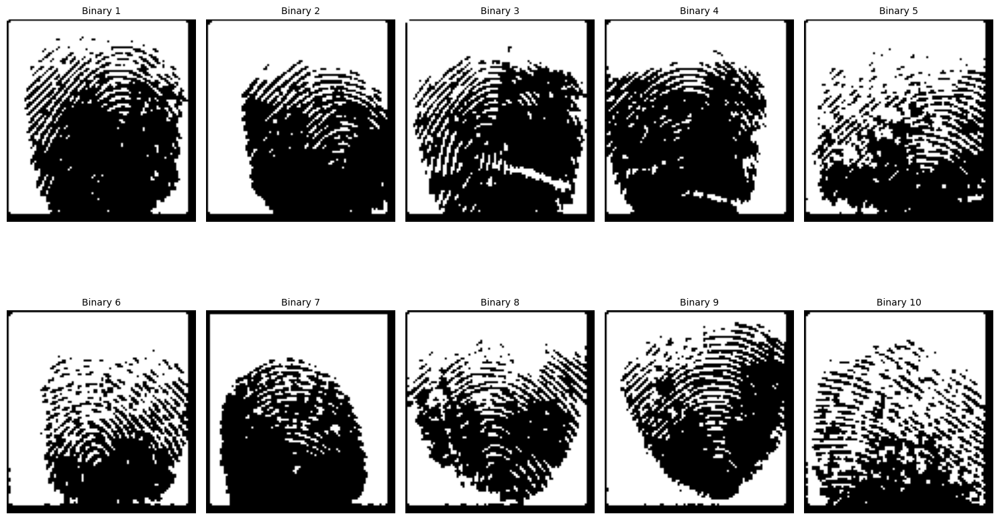

In [16]:
### OPTIONAL FOR SINGLE DATASET
otsu_thresh = [
    cv2.threshold(img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]
    for img in blurred_images
]
show_images_subplots(otsu_thresh, titles=[f"OTSU_THRESH {i+1}" for i in range(len(otsu_thresh))])

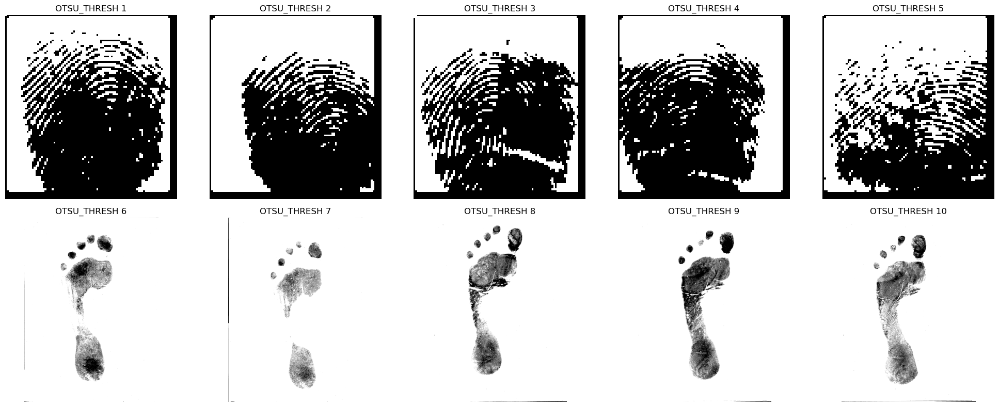

In [11]:
otsu_thresh = [
    cv2.threshold(img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]
    for img in blurred_images
]
show_images_subplots(otsu_thresh, titles=[f"OTSU_THRESH {i+1}" for i in range(len(otsu_thresh))])

**Adaptive_mean Thresholding**

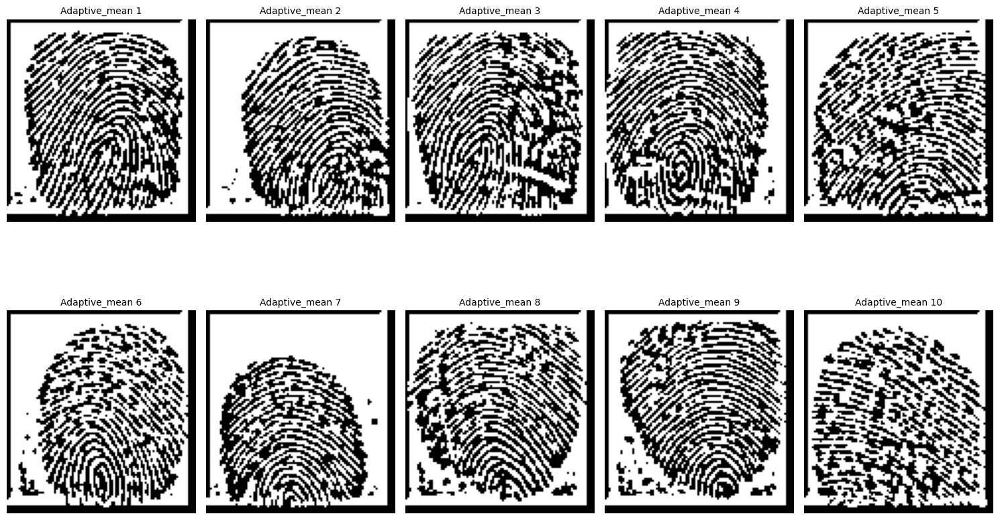

In [19]:
### OPTIONAL FOR SINGLE DATASET

adaptive_mean = [
    cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 2)
    for img in blurred_images
]
show_images_subplots(adaptive_mean, titles=[f"Adaptive_mean {i+1}" for i in range(len(adaptive_mean))])


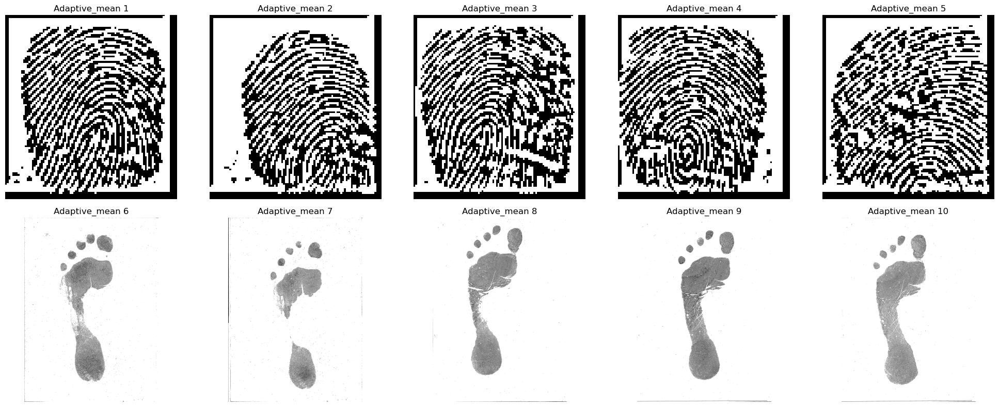

In [13]:
adaptive_mean = [
    cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 2)
    for img in blurred_images
]
show_images_subplots(adaptive_mean, titles=[f"Adaptive_mean {i+1}" for i in range(len(adaptive_mean))])


**Adaptive_gaussian Thresholdin**

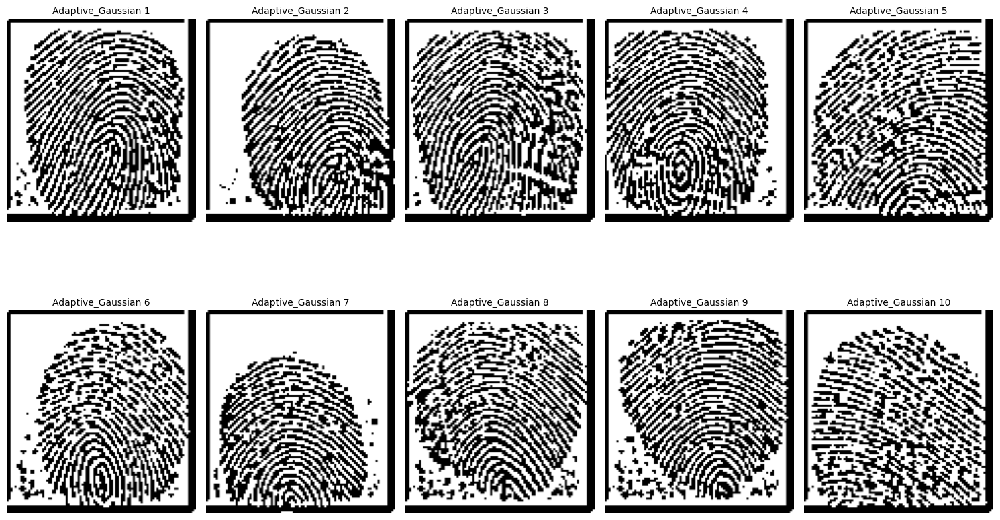

In [21]:
### OPTIONAL FOR SINGLE DATASET

adaptive_gaussian = [
     cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
     for img in blurred_images

]
show_images_subplots(adaptive_gaussian, titles=[f"Adaptive_Gaussian {i+1}" for i in range(len(adaptive_gaussian))])


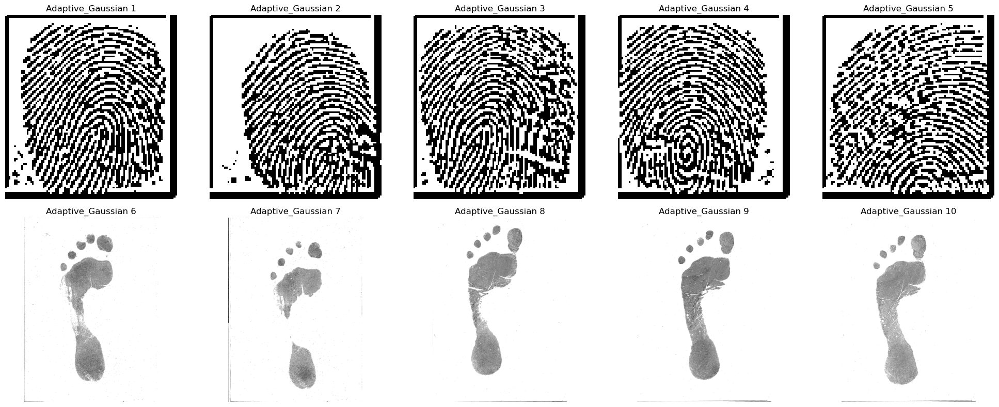

In [15]:
 adaptive_gaussian = [
     cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
     for img in blurred_images

]
show_images_subplots(adaptive_gaussian, titles=[f"Adaptive_Gaussian {i+1}" for i in range(len(adaptive_gaussian))])


**Global Thresholding**

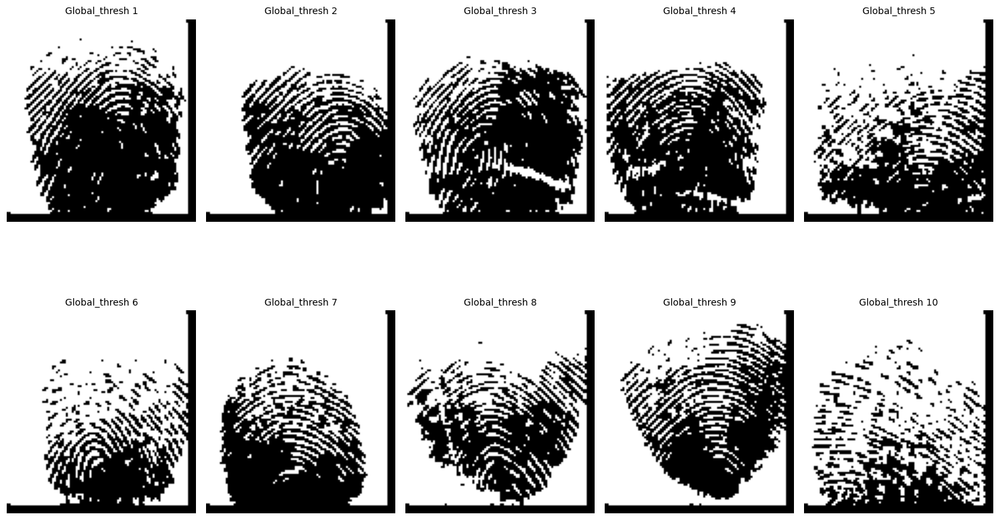

In [24]:
### OPTIONAL FOR SINGLE DATASET

Global_thresh = [
    cv2.threshold(img, 127, 255, cv2.THRESH_BINARY)[1]
    for img in blurred_images
]
show_images_subplots(Global_thresh, titles=[f"Global_thresh {i+1}" for i in range(len(Global_thresh))])

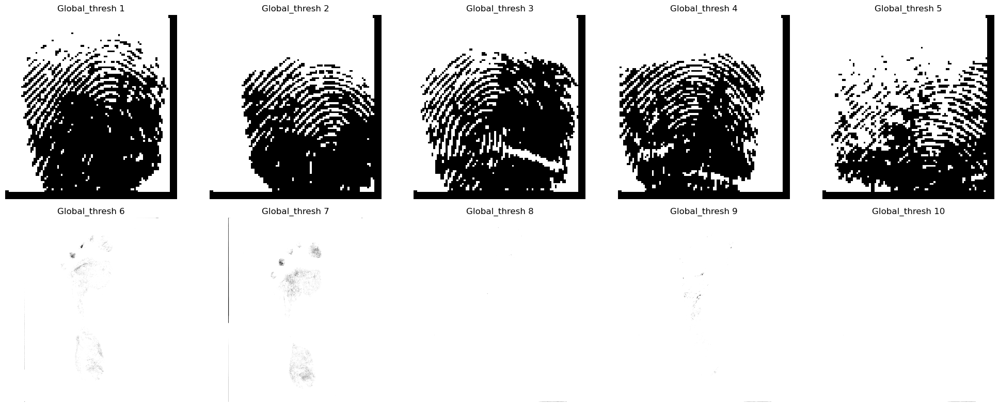

In [17]:
Global_thresh = [
    cv2.threshold(img, 127, 255, cv2.THRESH_BINARY)[1]
    for img in blurred_images
]
show_images_subplots(Global_thresh, titles=[f"Global_thresh {i+1}" for i in range(len(Global_thresh))])

***Image Morphology***

In [19]:
#define kernel
kernel = np.ones((3, 3), np.uint8)

**Erosion**

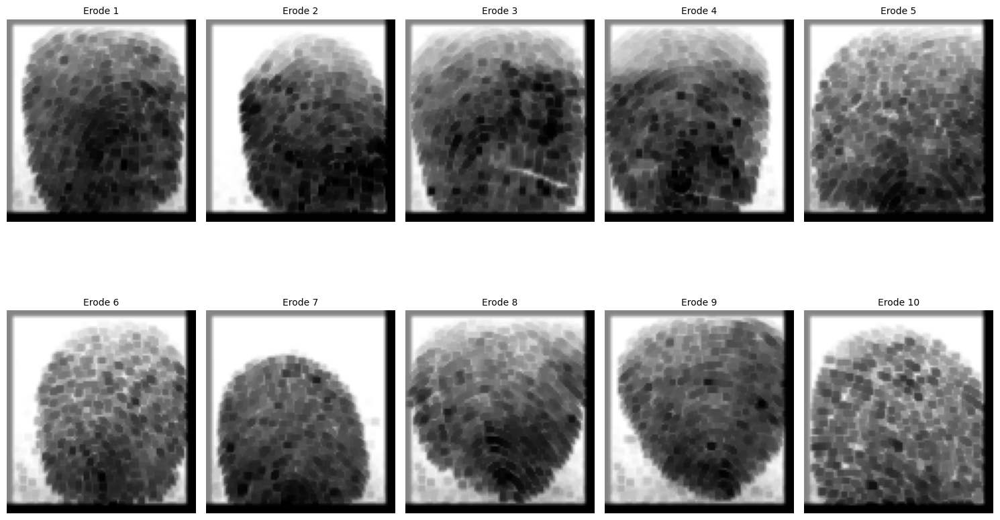

In [28]:
### OPTIONAL FOR SINGLE DATASET

erode_images = [
    cv2.erode(bin_img, kernel, iterations=1)
    for bin_img in blurred_images
]
show_images_subplots(erode_images, titles=[f"Erode {i+1}" for i in range(len(erode_images))])

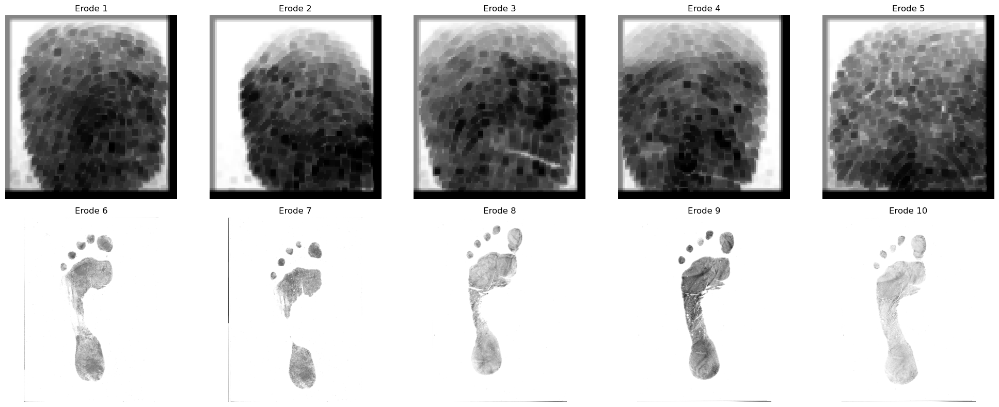

In [21]:
erode_images = [
    cv2.erode(bin_img, kernel, iterations=1)
    for bin_img in blurred_images
]
show_images_subplots(erode_images, titles=[f"Erode {i+1}" for i in range(len(erode_images))])

**Dilation**

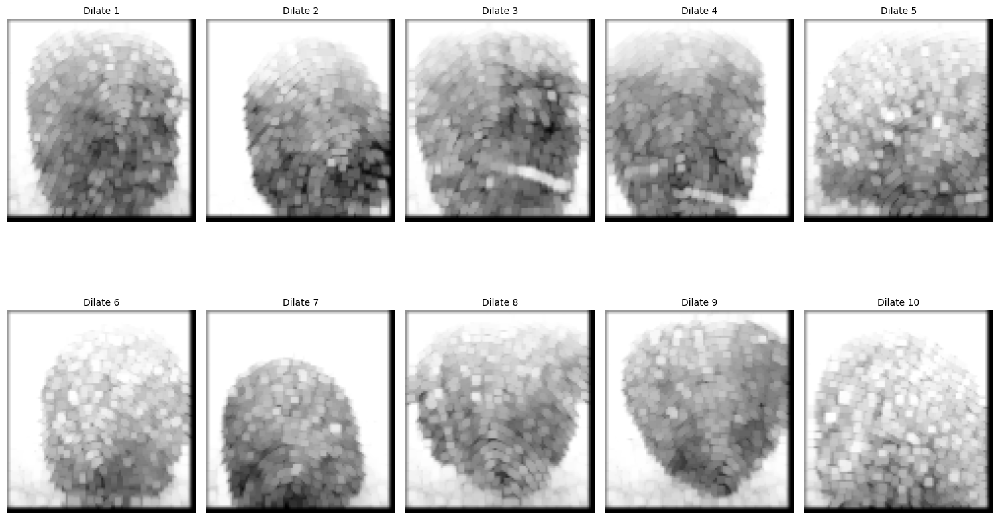

In [31]:
### OPTIONAL FOR SINGLE DATASET
dilate_images = [
    cv2.dilate(bin_img, kernel, iterations=1)
    for bin_img in blurred_images
]
show_images_subplots(dilate_images, titles=[f"Dilate {i+1}" for i in range(len(dilate_images))])

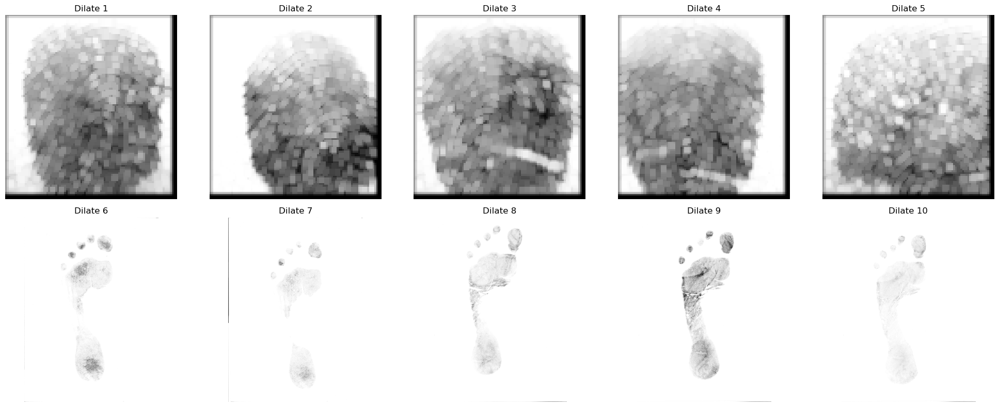

In [23]:
dilate_images = [
    cv2.dilate(bin_img, kernel, iterations=1)
    for bin_img in blurred_images
]
show_images_subplots(dilate_images, titles=[f"Dilate {i+1}" for i in range(len(dilate_images))])

**Opening**

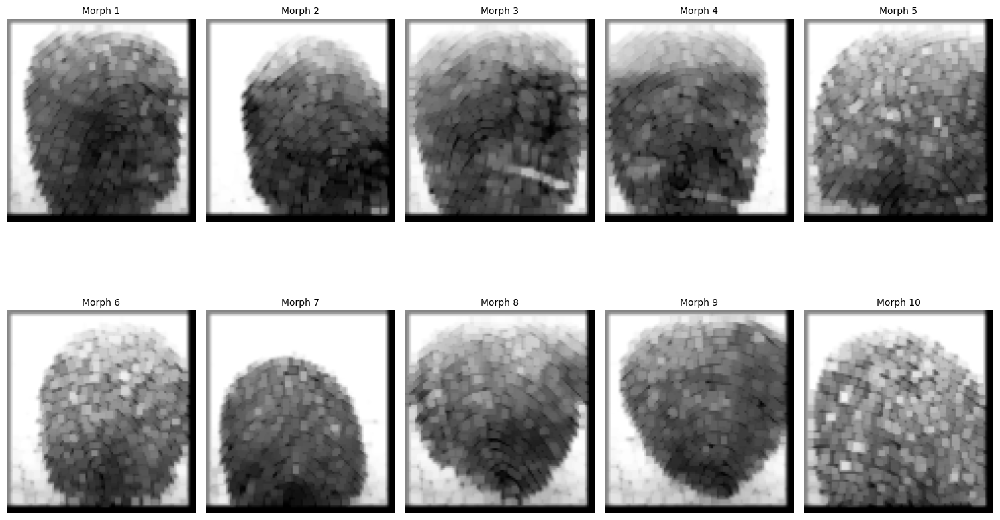

In [33]:
### OPTIONAL FOR SINGLE DATASET
morph_images = [
    cv2.morphologyEx(bin_img, cv2.MORPH_OPEN, kernel, iterations=1) #iterations optional parameter
    for bin_img in blurred_images
]
show_images_subplots(morph_images, titles=[f"Morph {i+1}" for i in range(len(morph_images))])

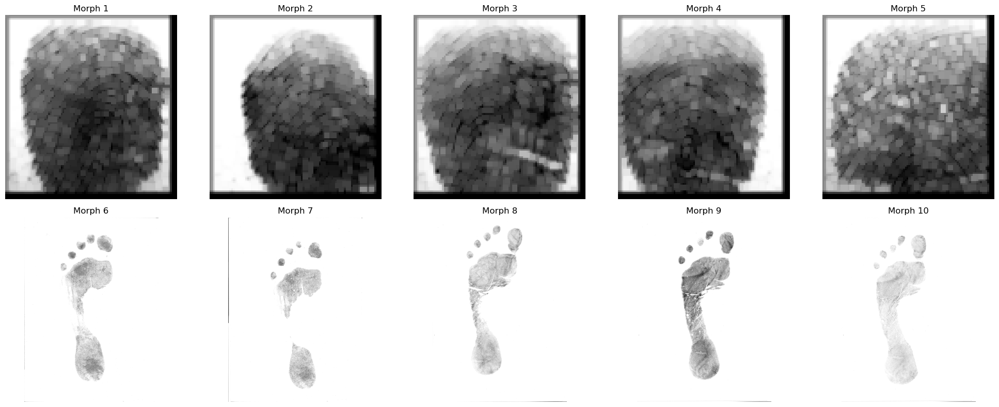

In [25]:
morph_images = [
    cv2.morphologyEx(bin_img, cv2.MORPH_OPEN, kernel, iterations=1) #iterations optional parameter
    for bin_img in blurred_images
]
show_images_subplots(morph_images, titles=[f"Morph {i+1}" for i in range(len(morph_images))])

**Closing**

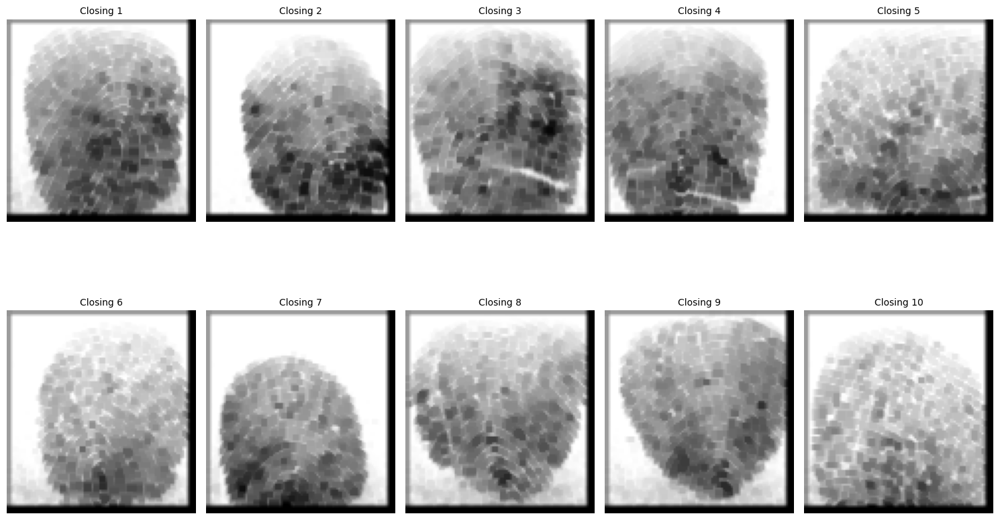

In [37]:
### OPTIONAL FOR SINGLE DATASET
morph_images_close = [
    cv2.morphologyEx(bin_img, cv2.MORPH_CLOSE, kernel, ) #iterations optional parameter
    for bin_img in blurred_images
]
show_images_subplots(morph_images_close, titles=[f"Closing {i+1}" for i in range(len(morph_images_close))])

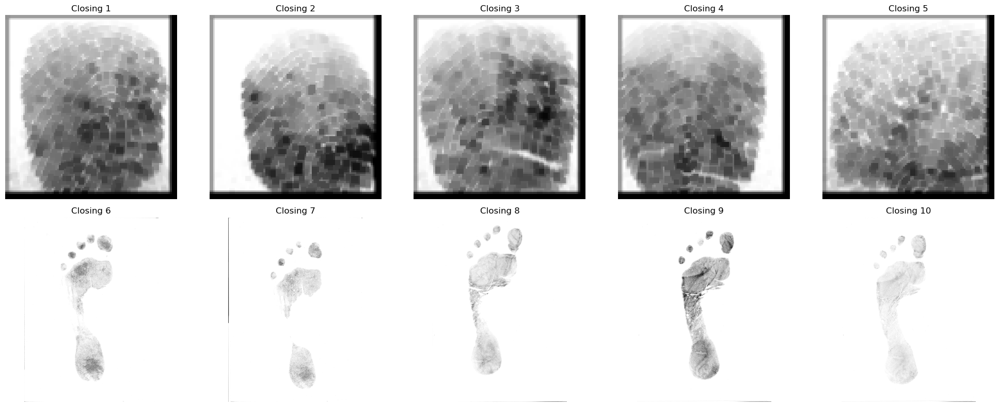

In [27]:
morph_images_close = [
    cv2.morphologyEx(bin_img, cv2.MORPH_CLOSE, kernel, ) #iterations optional parameter
    for bin_img in blurred_images
]
show_images_subplots(morph_images_close, titles=[f"Closing {i+1}" for i in range(len(morph_images_close))])

**Contour Detection**

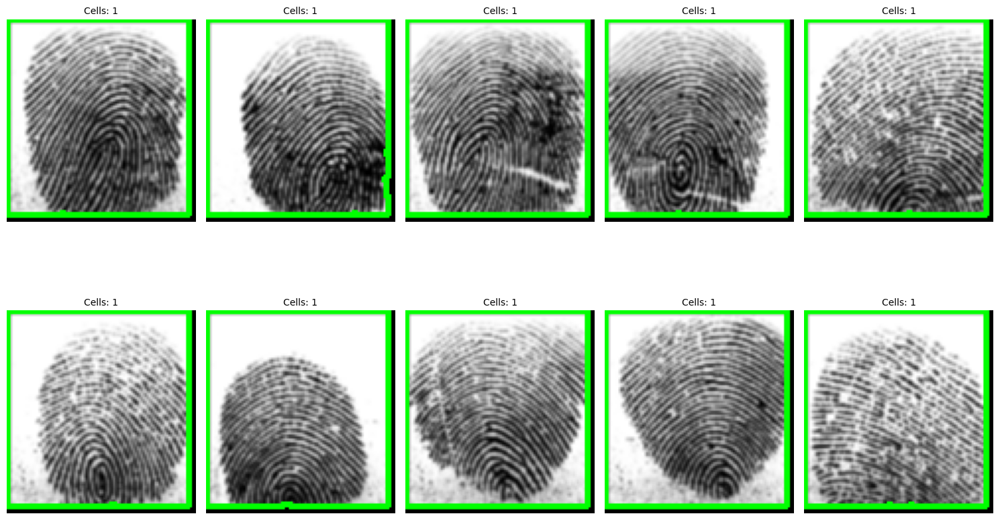

In [40]:
### OPTIONAL FOR SINGLE DATASET
images_with_contours = []
contour_titles = []

for i, (orig_img, proc_img) in enumerate(zip(blurred_images, morph_images)):
    color_img = cv2.cvtColor(orig_img, cv2.COLOR_GRAY2BGR)
    contours, _ = cv2.findContours(proc_img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    #filtered_contours = [cnt for cnt in contours if cv2.contourArea(cnt) > 10]

    cv2.drawContours(color_img, contours, -1, (0, 255, 0), 2)
    images_with_contours.append(color_img)
    contour_titles.append(f"Cells: {len(contours)}")

show_images_subplots(images_with_contours, titles=contour_titles, cmap=None)

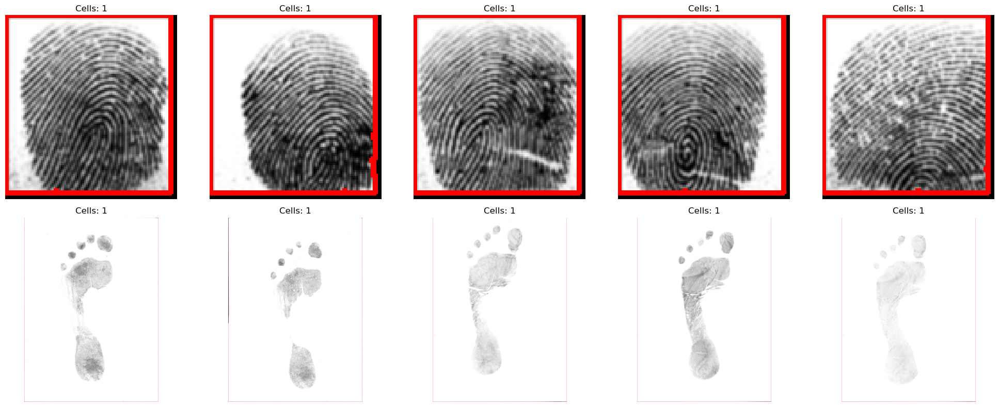

In [61]:
images_with_contours = []
contour_titles = []

for i, (orig_img, proc_img) in enumerate(zip(blurred_images, morph_images)):
    color_img = cv2.cvtColor(orig_img, cv2.COLOR_GRAY2BGR)
    contours, _ = cv2.findContours(proc_img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    filtered_contours = [cnt for cnt in contours if cv2.contourArea(cnt) > 10]

    cv2.drawContours(color_img, filtered_contours, -1, (255, 0, 0), 2)
    images_with_contours.append(color_img)
    contour_titles.append(f"Cells: {len(filtered_contours)}")

show_images_subplots(images_with_contours, titles=contour_titles,  )

**Best separation observed with Otsu's Thresholding Combined with Closing Morphology**

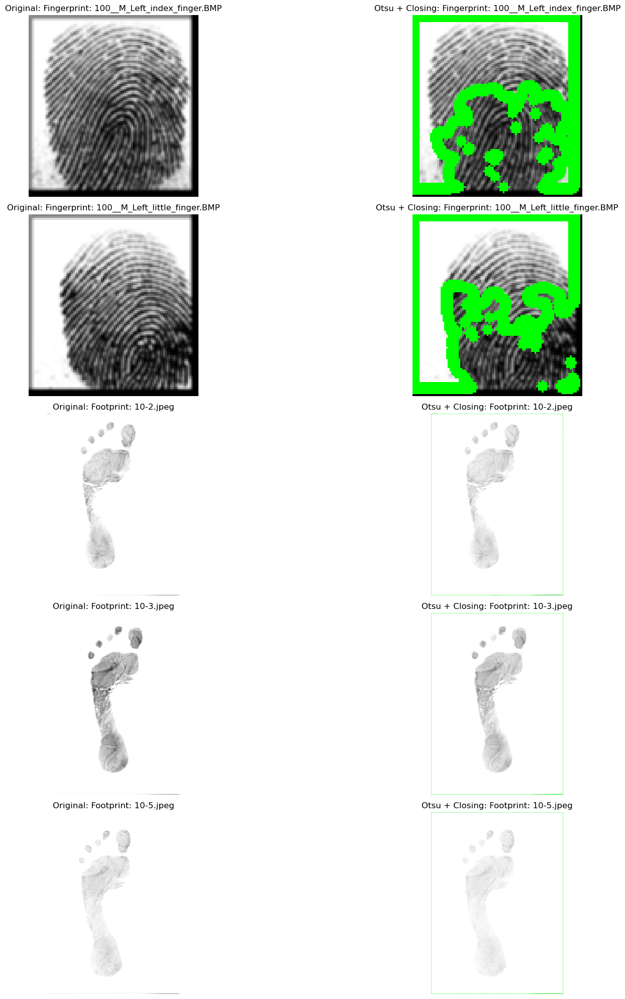

In [131]:
import cv2
import matplotlib.pyplot as plt
import os

# Function to display images side by side
def show_images_side_by_side(images1, images2, titles1, titles2, cols=5):
    #rows = max(len(images1), len(images2)) // cols + 1
    rows = len(images1)
    plt.figure(figsize=(20, 4 * rows))
    
    for i in range(len(images1)):
        plt.subplot(rows, 2, i * 2 + 1)
        plt.imshow(images1[i], cmap='gray')
        plt.title(titles1[i])
        plt.axis('off')
        
        plt.subplot(rows, 2, i * 2 + 2)
        plt.imshow(images2[i])
        plt.title(titles2[i])
        plt.axis('off')
        
    plt.tight_layout()
    plt.show()

# Subset for 5 fingerprints and 5 footprints
fingerprint_images = blurred_images[:2]
footprint_images = blurred_images[7:10]
fingerprint_titles = image_titles[:2]
footprint_titles = image_titles[7:10]

# Combined dataset
all_images = fingerprint_images + footprint_images
all_titles = fingerprint_titles + footprint_titles

# Assuming images and morph_images contain the original and processed images
otsu_images_with_closing = []
titles_original = []
titles_processed = []

# Loop to process and store Otsu + Closing results
for img, title in zip(all_images, all_titles):  # original_images contains grayscale images
    # Apply Otsu's Thresholding
    _, otsu_thresh = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    
    # Apply Closing
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5, 5))
    closing = cv2.morphologyEx(otsu_thresh, cv2.MORPH_CLOSE, kernel)
    
    # Detect contours and overlay on original image
    color_img = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
    contours, _ = cv2.findContours(closing, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cv2.drawContours(color_img, contours, -1, (0, 255, 0), 5)
    
    otsu_images_with_closing.append(color_img)
    titles_original.append(f"Original: {title}")
    titles_processed.append(f"Otsu + Closing: {title}")

# Display side by side
show_images_side_by_side(all_images, otsu_images_with_closing, titles_original, titles_processed)


**Best-Suited Techniques**

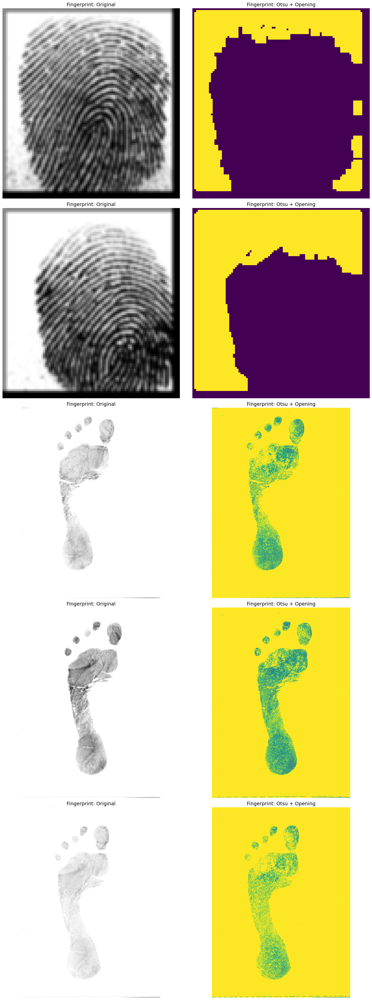

In [124]:
def show_images_two_columns(images1, images2, titles1, titles2):
    rows = len(images1)
    plt.figure(figsize=(16, 8 * rows))  # Adjusted figure size
    
    for i in range(len(images1)):
        # Display the original image
        plt.subplot(rows, 2, i * 2 + 1)
        plt.imshow(images1[i], cmap='gray')
        plt.title(titles1[i], fontsize=14)
        plt.axis('off')
        
        # Display the processed image
        plt.subplot(rows, 2, i * 2 + 2)
        plt.imshow(images2[i])
        plt.title(titles2[i], fontsize=14)
        plt.axis('off')
        
    plt.tight_layout()
    plt.show()

# Select only 10 images: 5 fingerprints and 5 footprints
fingerprint_images = blurred_images[:2]
footprint_images = blurred_images[7:10]
fingerprint_titles = image_titles[:2]
footprint_titles = image_titles[7:10]

# Processed images for fingerprints and footprints
processed_fingerprints = []
processed_footprints = []

# Process fingerprints using Otsu's Thresholding with Opening
for img in fingerprint_images:
    # Otsu's Thresholding
    _, otsu_thresh = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    
    # Opening
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5, 5))
    opening = cv2.morphologyEx(otsu_thresh, cv2.MORPH_OPEN, kernel)
    processed_fingerprints.append(opening)

# Process footprints using Adaptive Gaussian Thresholding with Closing
for img in footprint_images:
    # Adaptive Gaussian Thresholding
    adaptive_gaussian = cv2.adaptiveThreshold(
        img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2
    )
    
    # Closing
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    closing = cv2.morphologyEx(adaptive_gaussian, cv2.MORPH_CLOSE, kernel)
    processed_footprints.append(closing)

# Combine original and processed images for display
all_original_images = fingerprint_images + footprint_images
all_processed_images = processed_fingerprints + processed_footprints
all_original_titles = ["Fingerprint: Original"] * 5 + ["Footprint: Original"] * 5
all_processed_titles = ["Fingerprint: Otsu + Opening"] * 5 + ["Footprint: Adaptive Gaussian + Closing"] * 5

# Display side-by-side comparison
show_images_two_columns(all_original_images, all_processed_images, all_original_titles, all_processed_titles)
